<a href="https://colab.research.google.com/github/aaaaaamah99/Computer_Vision/blob/main/Classification_of_Covid_19_Pneumonia_on_CT_Scans.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'covid19normalpneumonia-ct-images:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F832492%2F1421897%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240515%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240515T023123Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D3dc14af137ebbaf09745137bee8005f5d137648fb2acc3d9d7a21abea64d7624e3f9df96eba633dc145a15be2a06279403681a861498e574b572045df42bc40139b9505239822542e29d7002aed12eaa2091bdc80d25917709355acac692ffdf4f515ab993c9890f3af056f8535c9b16216776dd096f3072b5500bed83488582e7ca03b819341849bc145920a761b66dd3a711e1da22891c2541bf9a4d83201a2cf4839e33e301a8ec2e8127c10e68fa186bdb1c90f4e1858b3bb24224b73427e4524fc2894696c6dce85785e55b133d1d7044cdc09bd9c2816040004daeb125615f3f642bd88537c672bef38103c624ef38760840676b76a68482d8e8cc9055'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


[==================================================] 981279236 bytes downloaded
Downloaded and uncompressed: covid19normalpneumonia-ct-images
Data source import complete.


# Importing essential libraries

In [ ]:
!pip install --upgrade tensorflow keras


In [ ]:
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import time
import os
import shutil
import random
import cv2
import zipfile
import matplotlib.cm as cm

from tensorflow.keras.applications.resnet_v2 import ResNet50V2
from tensorflow.keras.applications.xception import Xception
from tensorflow.keras.applications.densenet import DenseNet121
from tensorflow.keras.applications import InceptionV3

from tensorflow.keras.applications.resnet_v2 import preprocess_input, decode_predictions
from tensorflow.keras.utils import Progbar
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.losses import CategoricalCrossentropy, BinaryCrossentropy
from tensorflow.keras.optimizers import Adam, RMSprop, Nadam
from tensorflow.keras.optimizers.schedules import InverseTimeDecay, ExponentialDecay
from tensorflow.keras.preprocessing.image import ImageDataGenerator  # Updated import path
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.metrics import CategoricalAccuracy, Precision, Recall
from tensorflow.keras.layers import Dense, Conv2D, BatchNormalization, MaxPool2D, AveragePooling2D, Flatten, Input, GlobalAveragePooling2D
from tensorflow.keras.utils import plot_model  # Correct import path for plot_model
from tensorflow.keras.utils import get_custom_objects
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay


# Deleting directories in order to recreate

In [ ]:
try:
    shutil.rmtree("./train")
    shutil.rmtree("./test")
    shutil.rmtree("./val")

except OSError as e:
    print("Directories never existed")

# Creating data directories and splitting into Train, Test, Valid

In [ ]:
path = "../input/covid19normalpneumonia-ct-images"
classesPath = ['COVID2_CT', 'Normal_CT', 'pneumonia_CT']

np.random.seed(seed = 90)

val_ratio = 0.1
test_ratio = 0.1
seed = 90

for cls in classesPath:
    os.makedirs('./train/' + cls)
    os.makedirs('./val/' + cls)
    os.makedirs('./test/' + cls)

    src = path + "/" + cls

    allFileNames = os.listdir(src)
    np.random.shuffle(allFileNames)
    train_FileNames, val_FileNames, test_FileNames = np.split(np.array(allFileNames),
                                                              [int(len(allFileNames) * (1 - (val_ratio + test_ratio))),
                                                               int(len(allFileNames) * (1 - test_ratio))])

    train_FileNames = [src + '/' + name for name in train_FileNames.tolist()]
    val_FileNames = [src + '/' + name for name in val_FileNames.tolist()]
    test_FileNames = [src + '/' + name for name in test_FileNames.tolist()]

    print('Total ', str(cls), len(allFileNames))
    print('Training', len(train_FileNames))
    print('Validation', len(val_FileNames))
    print('Testing', len(test_FileNames))
    print("\n")

    for name in train_FileNames:
        shutil.copy(name, './train/' + cls)

    for name in val_FileNames:
        shutil.copy(name, './val/' + cls)

    for name in test_FileNames:
        shutil.copy(name, './test/' + cls)

Total  COVID2_CT 2035
Training 1628
Validation 203
Testing 204


Total  Normal_CT 2119
Training 1695
Validation 212
Testing 212


Total  pneumonia_CT 3390
Training 2712
Validation 339
Testing 339




# Creating image data generator for training and testing

In [ ]:
path_train = "./train"
path_val = "./val"
path_test = "./test"

batch_size = 32
batch_test_size = 16
seed = 90
interpolation = "bicubic"
target_size = (256, 256)
epochs = 50

train_data_gen = ImageDataGenerator(rotation_range = 10,
                                    zoom_range = 0.5,
                                    horizontal_flip=True)


test_data_gen = ImageDataGenerator()

ds_train = train_data_gen.flow_from_directory(directory = path_train,
                                              color_mode = "rgb",
                                              batch_size = batch_size,
                                              class_mode='categorical',
                                              target_size = target_size,
                                              shuffle = True,
                                              interpolation = interpolation,
                                              seed = seed)

ds_val = test_data_gen.flow_from_directory(directory = path_val,
                                           color_mode = "rgb",
                                           batch_size = batch_size,
                                           class_mode='categorical',
                                           target_size = target_size,
                                           shuffle = True,
                                           interpolation = interpolation,
                                           seed = seed)

ds_test = test_data_gen.flow_from_directory(directory = path_test,
                                            color_mode = "rgb",
                                            batch_size = batch_test_size,
                                            target_size = target_size,
                                            class_mode='categorical',
                                            shuffle = False,
                                            interpolation = interpolation,
                                            seed = seed)

Found 6035 images belonging to 3 classes.
Found 754 images belonging to 3 classes.
Found 755 images belonging to 3 classes.


# 2. DenseNet121 Model

29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.229265 to fit



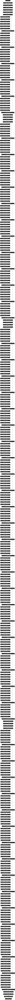

In [ ]:
model_DenseNet = DenseNet121(weights='imagenet',include_top=False)
full_name = "DenseNet_Model"

x = model_DenseNet.output
x = GlobalAveragePooling2D(name = "GlobalAveragePooling_1")(x)

y_hat = Dense(3,'softmax', name = "Output")(x)

model_DenseNet = Model(inputs=model_DenseNet.input, outputs = y_hat)

if not os.path.exists("./Weights"):
    os.makedirs('./Weights')
if not os.path.exists("./Weights/DenseNet"):
    os.makedirs('./Weights/DenseNet')

filepath = "./Weights/DenseNet/%s-Final-{epoch:02d}-{val_accuracy:.4f}.hdf5"%full_name

plot_model(model_DenseNet, show_shapes = True, show_layer_names = True, to_file = "DenseNet.png")

In [ ]:
filepath = "./Weights/DenseNet/DenseNet_Model-Final-{epoch:02d}-{val_accuracy:.4f}.keras"


In [ ]:
earlystop = EarlyStopping(patience=5)
checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', save_best_only=True, mode='max') #creating checkpoint to save the best validation accuracy
callbacks_list = [earlystop, checkpoint]
model_DenseNet.compile(optimizer=Nadam(learning_rate=0.0001), loss='categorical_crossentropy',metrics=['accuracy'])

historyDenseNet = model_DenseNet.fit(ds_train, epochs=epochs,validation_data=ds_val,shuffle=True,callbacks=callbacks_list)

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


189/189 ━━━━━━━━━━━━━━━━━━━━ 472s 1s/step - accuracy: 0.7907 - loss: 0.4879 - val_accuracy: 0.9058 - val_loss: 0.2215
Epoch 2/50
189/189 ━━━━━━━━━━━━━━━━━━━━ 226s 899ms/step - accuracy: 0.9583 - loss: 0.1078 - val_accuracy: 0.9881 - val_loss: 0.0354
Epoch 3/50
189/189 ━━━━━━━━━━━━━━━━━━━━ 194s 853ms/step - accuracy: 0.9746 - loss: 0.0742 - val_accuracy: 0.9841 - val_loss: 0.0440
Epoch 4/50
189/189 ━━━━━━━━━━━━━━━━━━━━ 173s 884ms/step - accuracy: 0.9860 - loss: 0.0376 - val_accuracy: 0.9775 - val_loss: 0.0488
Epoch 5/50
189/189 ━━━━━━━━━━━━━━━━━━━━ 200s 877ms/step - accuracy: 0.9809 - loss: 0.0504 - val_accuracy: 0.9973 - val_loss: 0.0106
Epoch 6/50
189/189 ━━━━━━━━━━━━━━━━━━━━ 169s 872ms/step - accuracy: 0.9898 - loss: 0.0301 - val_accuracy: 0.9735 - val_loss: 0.0824
Epoch 7/50
189/189 ━━━━━━━━━━━━━━━━━━━━ 205s 889ms/step - accuracy: 0.9873 - loss: 0.0301 - val_accuracy: 0.9894 - val_loss: 0.0363
Epoch 8/50
189/189 ━━━━━━━━━━━━━━━━━━━━ 197s 864ms/step - accuracy: 0.9906 - loss: 0.0291 

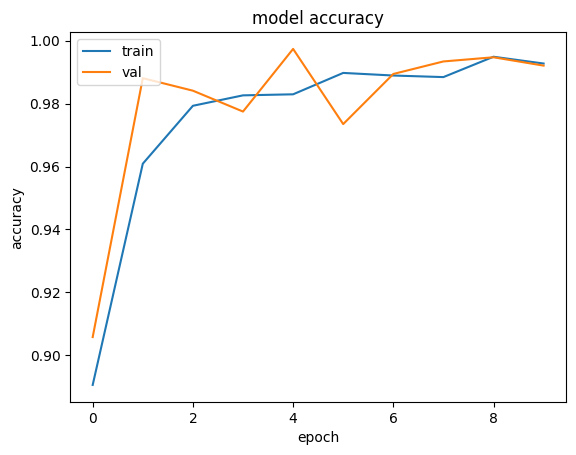

In [ ]:
plt.plot(historyDenseNet.history['accuracy'])
plt.plot(historyDenseNet.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

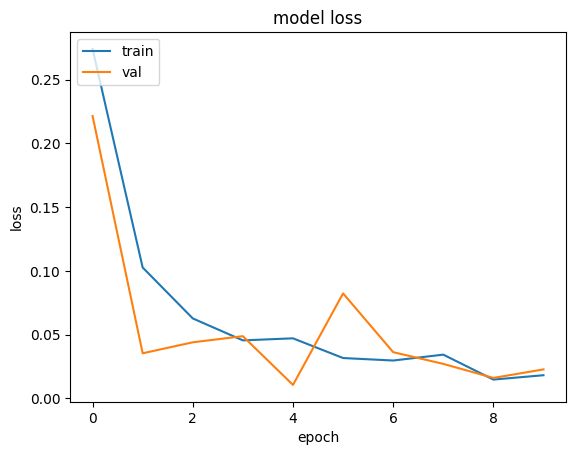

In [ ]:
plt.plot(historyDenseNet.history['loss'])
plt.plot(historyDenseNet.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
# model_DenseNet.load_weights("./Weights/DenseNet/DenseNet_Model-Final-10-1.0000.hdf5")
# resultsDenseNet = model_DenseNet.evaluate(ds_test)

# 3. ResNet50V2

In [ ]:
model_ResNet = ResNet50V2(weights='imagenet',include_top=False)
full_name = "ResNet_Model"

x = model_ResNet.output
x = GlobalAveragePooling2D(name = "GlobalAveragePooling_1")(x)

y_hat = Dense(3,'softmax', name = "Output")(x)

model_ResNet = Model(inputs=model_ResNet.input, outputs = y_hat)

if not os.path.exists("./Weights"):
    os.makedirs('./Weights')
if not os.path.exists("./Weights/ResNet"):
    os.makedirs('./Weights/ResNet')

filepath = "./Weights/ResNet/%s-Final-{epoch:02d}-{val_accuracy:.4f}.hdf5"%full_name

plot_model(model_ResNet, show_shapes = True, show_layer_names = True, to_file = "ResNet.png")

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.532027 to fit



In [ ]:
filepath = "./Weights/ResNet/%s-Final-{epoch:02d}-{val_accuracy:.4f}.keras"%full_name

In [ ]:
earlystop = EarlyStopping(patience=5)
checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', save_best_only=True, mode='max') #creating checkpoint to save the best validation accuracy
callbacks_list = [earlystop, checkpoint]
model_ResNet.compile(optimizer=Nadam(learning_rate=0.0001), loss='categorical_crossentropy',metrics=['accuracy'])

historyResNet = model_ResNet.fit(ds_train, epochs=epochs,validation_data=ds_val,shuffle=True,callbacks=callbacks_list)

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


189/189 ━━━━━━━━━━━━━━━━━━━━ 271s 1s/step - accuracy: 0.7799 - loss: 0.4913 - val_accuracy: 0.7095 - val_loss: 0.9795
Epoch 2/50
189/189 ━━━━━━━━━━━━━━━━━━━━ 169s 867ms/step - accuracy: 0.9507 - loss: 0.1352 - val_accuracy: 0.8236 - val_loss: 0.5651
Epoch 3/50
189/189 ━━━━━━━━━━━━━━━━━━━━ 162s 827ms/step - accuracy: 0.9638 - loss: 0.0908 - val_accuracy: 0.8117 - val_loss: 0.6788
Epoch 4/50
189/189 ━━━━━━━━━━━━━━━━━━━━ 207s 857ms/step - accuracy: 0.9788 - loss: 0.0620 - val_accuracy: 0.9907 - val_loss: 0.0253
Epoch 5/50
189/189 ━━━━━━━━━━━━━━━━━━━━ 162s 833ms/step - accuracy: 0.9834 - loss: 0.0541 - val_accuracy: 0.9828 - val_loss: 0.0440
Epoch 6/50
189/189 ━━━━━━━━━━━━━━━━━━━━ 162s 828ms/step - accuracy: 0.9774 - loss: 0.0645 - val_accuracy: 0.8568 - val_loss: 0.6069
Epoch 7/50
189/189 ━━━━━━━━━━━━━━━━━━━━ 161s 818ms/step - accuracy: 0.9817 - loss: 0.0478 - val_accuracy: 0.9416 - val_loss: 0.1808
Epoch 8/50
189/189 ━━━━━━━━━━━━━━━━━━━━ 169s 872ms/step - accuracy: 0.9874 - loss: 0.0430 

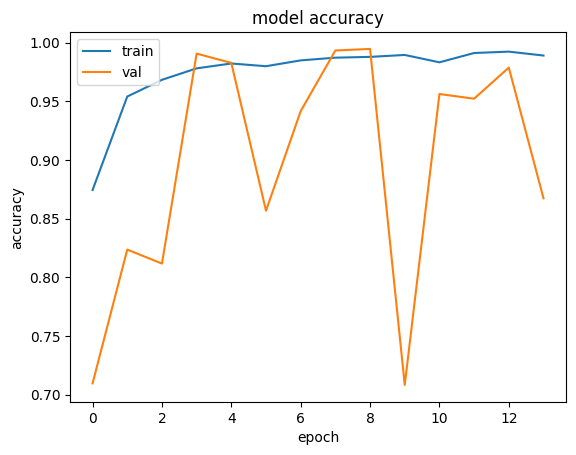

In [ ]:
plt.plot(historyResNet.history['accuracy'])
plt.plot(historyResNet.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

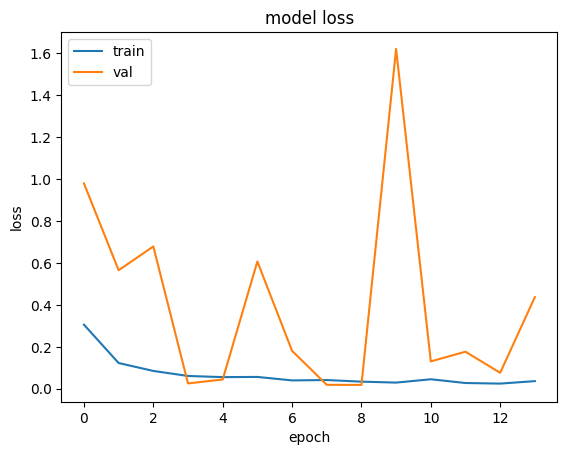

In [ ]:
plt.plot(historyResNet.history['loss'])
plt.plot(historyResNet.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
# model_ResNet.load_weights(filepath)
# resultsResnet = model_ResNet.evaluate(ds_test)

# 4. InceptionV3

In [ ]:
model_Inception = InceptionV3(weights='imagenet',include_top=False)
full_name = "Inception_Model"

x = model_Inception.output
x = GlobalAveragePooling2D(name = "GlobalAveragePooling_1")(x)

y_hat = Dense(3,'softmax', name = "Output")(x)

model_Inception = Model(inputs=model_Inception.input, outputs = y_hat)

if not os.path.exists("./Weights"):
    os.makedirs('./Weights')
if not os.path.exists("./Weights/Inception"):
    os.makedirs('./Weights/Inception')

filepath = "./Weights/Inception/%s-Final-{epoch:02d}-{val_accuracy:.4f}.hdf5"%full_name

plot_model(model_Inception, show_shapes = True, show_layer_names = True, to_file = "Inception.png")

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.619156 to fit



In [ ]:
filepath = "./Weights/Inception/%s-Final-{epoch:02d}-{val_accuracy:.4f}.keras"%full_name

In [ ]:
earlystop = EarlyStopping(patience=5)
checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', save_best_only=True, mode='max') #creating checkpoint to save the best validation accuracy
callbacks_list = [earlystop, checkpoint]
model_Inception.compile(optimizer=Nadam(learning_rate=0.0001), loss='categorical_crossentropy',metrics=['accuracy'])

historyInception = model_Inception.fit(ds_train, epochs=epochs,validation_data=ds_val,shuffle=True,callbacks=callbacks_list)

Epoch 1/50
 12/189 ━━━━━━━━━━━━━━━━━━━━ 2:23 808ms/step - accuracy: 0.4271 - loss: 1.0377

In [ ]:
plt.plot(historyInception.history['accuracy'])
plt.plot(historyInception.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

NameError: name 'plt' is not defined

In [ ]:
plt.plot(historyInception.history['loss'])
plt.plot(historyInception.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
# model_Inception.load_weights(filepath)
# resultsInception = model_Inception.evaluate(ds_test)